<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           Segmentation des clients Olist
        </h1>
    </div>
</div>


- Nous souhaitons obtenir une segmentation des clients Olist utilisable au quotidien par leur équipe marketing dans leurs campagnes de communication.
- L'objectif est de comprendre les différents types d'utilisateurs grâce à leur comportement et à leurs données personnelles 

- Nous devrons également fournir une analyse de la stabilité des segments au cours du temps (dans le but d'établir un contrat de maintenance).

Nous utilisererons donc des méthodes non supervisées pour regrouper l'ensemble des clients de profils similaires.

_Code source format : pep8_

# Sommaire

- **[Distribution des variables](#va)**

- **[Preprocessing](#pr)**

- **[ACP](#acp)**

- **[TSNE vs ACP](#ts)**

- **[Kmeans](#kmeans)**

- **[Coefficient de silhouette](#si)**

- **[Kmeans avec la metric calinski_harabasz](#cal)**

- **[Separation inter clusters](#sep)**

- **[Projection de nos clusters sur nos axes ACP](#pro)**

- **[Hierarchical Clustering](#hi)**

- **[Analyse du clustering k means sur le dataset](#an)**

- **[Interprétation des clusters](#in)**

- **[K-Means après réduction de dimenssions](#rd)**

- **[Stabilité du K-Means](#st)**

- **[Clusterisation temporelle](#tm)**


In [1]:
# !pip install yellowbrick

In [2]:
# Librairies graphiques, mathématiques et de manipulation de données
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from datetime import timedelta
from mpl_toolkits.mplot3d import Axes3D
from math import pi
import plotly.graph_objects as go
import time
import pickle

# Création de Pipeline
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.compose import ColumnTransformer

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Transformateurs de variables
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder

from sklearn.pipeline import make_pipeline
# Méthodes de clustering
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import DBSCAN

# Metrics de Clustering
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import adjusted_rand_score


from sklearn.impute import KNNImputer
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from sklearn.preprocessing import FunctionTransformer

import plotly.offline as pyo
pyo.init_notebook_mode()

# checking pep8 compliance
%load_ext pycodestyle_magic
%pycodestyle_on

In [3]:
# Clustering Librairies import
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, estimate_bandwidth
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import InterclusterDistance
from kmodes.kprototypes import KPrototypes

In [4]:
# import utils own functions
import importlib
import utils
importlib.reload(utils)

<module 'utils' from '/media/ismail/Elements/formation/livrable/P4_azdad_ismail/utils.py'>

In [5]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [69]:
data = pd.read_csv(os.path.join("olist-customers-segmentation.csv"))
del_features_list = [
    "Unnamed: 0",
    "distance",
    "mean_payment_sequential",
    "mean_items",
    "nb_orders"]
data.drop(del_features_list, axis=1, inplace=True)
data.set_index("customer_unique_id", inplace=True)
numerical_features = list(data.select_dtypes(include=['float64']).columns)
original_data = data
data.head()

,total_freight,mean_payment_installments,mean_review_score,delai_dernier_achat_mean,delai_livraison,Tot_moy_achats,favorite_sale_month
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,12.00,8.0,5.0,115.0,6.0,129.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,8.29,1.0,4.0,118.0,2.0,18.90,5.0
0000f46a3911fa3c0805444483337064,17.22,8.0,3.0,541.0,25.0,69.00,3.0
0000f6ccb0745a6a4b88665a16c9f078,17.63,4.0,4.0,325.0,20.0,25.99,10.0
0004aac84e0df4da2b147fca70cf8255,16.89,6.0,5.0,292.0,13.0,180.00,11.0


Comme nous l avons vu dans le notebook de nettoyage , il faut eviter que les variables soit correles .
Pour notre segmentation , il faut eviter que certaines variables en **cache d autre**. 
C est pour cela que nous avons eliminer au fur et à mesure de nos tests certaines variables comme les categories , d autre informations comme le nombre moyen de paiements(qui est generalement a un) , n ajoutais pas de la pertinence lors de notre segmentation

In [70]:
data.head()

,total_freight,mean_payment_installments,mean_review_score,delai_dernier_achat_mean,delai_livraison,Tot_moy_achats,favorite_sale_month
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,12.00,8.0,5.0,115.0,6.0,129.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,8.29,1.0,4.0,118.0,2.0,18.90,5.0
0000f46a3911fa3c0805444483337064,17.22,8.0,3.0,541.0,25.0,69.00,3.0
0000f6ccb0745a6a4b88665a16c9f078,17.63,4.0,4.0,325.0,20.0,25.99,10.0
0004aac84e0df4da2b147fca70cf8255,16.89,6.0,5.0,292.0,13.0,180.00,11.0


<a name='va'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           Distribution de nos variables
        </h1>
    </div>
</div>

In [8]:
data.columns

Index(['total_freight', 'mean_payment_installments', 'mean_review_score',
       'delai_dernier_achat_mean', 'delai_livraison', 'Tot_moy_achats',
       'favorite_sale_month'],
      dtype='object')

In [9]:
from scipy import stats

quantitativescol = sorted(
    list(data.select_dtypes(include=['float', 'int64']).columns))

numeric_columns = data[quantitativescol]
numeric_columns = numeric_columns[1:]

for column in numeric_columns:
    print('________\n{}'.format(column))
    D, p = stats.kstest(
        data[column].dropna(),
        'norm',
        args=(data[column].mean(), data[column].std()))
    alpha = 5e-2
    print("p = {}".format(p))
    if p < alpha:  # null hypothesis: x comes from a normal distribution
        print("The null hypothesis can be rejected : {} "
              + "is not from a normal distribution".format(column))
    else:
        print("The null hypothesis cannot be rejected")

________
Tot_moy_achats
p = 0.0
The null hypothesis can be rejected : {} is not from a normal distribution
________
delai_dernier_achat_mean
p = 1.6472824885845698e-306
The null hypothesis can be rejected : {} is not from a normal distribution
________
delai_livraison
p = 0.0
The null hypothesis can be rejected : {} is not from a normal distribution
________
favorite_sale_month
p = 0.0
The null hypothesis can be rejected : {} is not from a normal distribution
________
mean_payment_installments
p = 0.0
The null hypothesis can be rejected : {} is not from a normal distribution
________
mean_review_score
p = 0.0
The null hypothesis can be rejected : {} is not from a normal distribution
________
total_freight
p = 0.0
The null hypothesis can be rejected : {} is not from a normal distribution


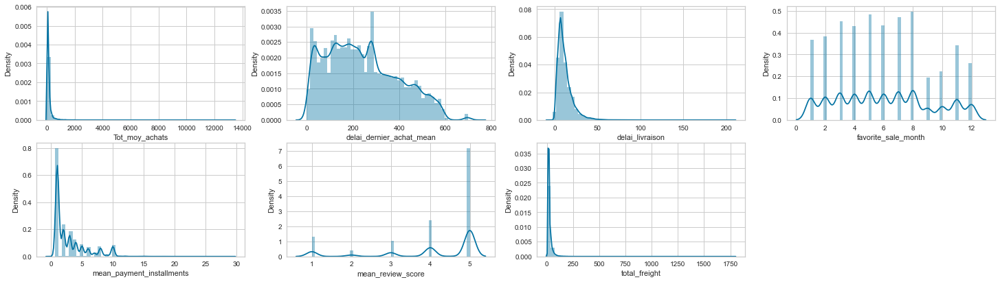

In [10]:
import warnings
warnings.filterwarnings('ignore')
quantitativescol = sorted(
    list(data.select_dtypes(include=['float', 'int64']).columns))

fig = plt.figure(1, figsize=(25, 25))
for i, label in enumerate(quantitativescol):
    plt.subplot(7, 4, i + 1)
    sns.distplot(data[label])
plt.show()

Passage au log des variables ne presentant pas une distribution normal

In [71]:
# passage au log de nos variables ne presentant pas de distribution normal
data['total_freight'] = np.where(
    data['total_freight'] > 0, np.log2(data['total_freight']), 0)
data['delai_livraison'] = np.where(
    data['delai_livraison'] > 0, np.log2(data['delai_livraison']), 0)
data['Tot_moy_achats'] = np.where(
    data['Tot_moy_achats'] > 0, np.log2(data['Tot_moy_achats']), 0)
data['mean_payment_installments'] = np.where(
    data['mean_payment_installments'] > 0,
    np.log2(data['mean_payment_installments']),
    0)

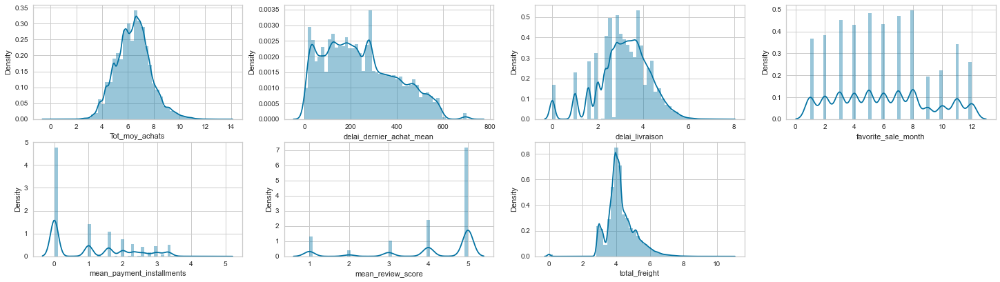

In [12]:
import warnings
warnings.filterwarnings('ignore')
quantitativescol = sorted(
    list(data.select_dtypes(include=['float', 'int64']).columns))

fig = plt.figure(1, figsize=(25, 25))
for i, label in enumerate(quantitativescol):
    plt.subplot(7, 4, i + 1)
    sns.distplot(data[label])
plt.show()

<a name='pr'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           Processiong pipeline
        </h1>
    </div>
</div>

Nous allons devoir standardiser nos variables, ici nous avons choisi <code>StandarScaler</code>
La fonction va recalculer chaque caractéristiques  afin que les données soient centré autour de 0 et avec un Ecart-Type de 1
<img src='https://www.datacorner.fr/wp-content/uploads/2018/08/standardscaler.jpg'></img>
A noter : Le choix du standardiseur est important , en effet le resultats des predictions vont grandement variees en function des standardiseur choisis

In [72]:
X = data.copy()

In [73]:
X = data.copy()
preprocessor = ColumnTransformer([
     ('scaler', StandardScaler(), numerical_features),
])

In [74]:
# X = data.copy()
X_scaled = preprocessor.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, index=X.index, columns=X.columns)
X_scaled_sample = X_scaled.sample(10000, random_state=21)
X_scaled.describe()

,total_freight,mean_payment_installments,mean_review_score,delai_dernier_achat_mean,delai_livraison,Tot_moy_achats,favorite_sale_month
count,9.498900e+04,9.498900e+04,9.498900e+04,9.498900e+04,9.498900e+04,9.498900e+04,9.498900e+04
mean,-8.697302e-16,7.001526e-17,-2.071285e-16,5.744842e-17,1.675579e-16,4.182963e-16,-6.717276e-17
std,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00
min,-4.975723e+00,-9.259879e-01,-2.359389e+00,-1.584502e+00,-2.859363e+00,-4.962331e+00,-1.558588e+00
25%,-5.188458e-01,-9.259879e-01,-8.148255e-02,-8.133648e-01,-5.295470e-01,-6.600582e-01,-9.390984e-01
50%,-1.441067e-01,-6.070670e-02,6.778197e-01,-1.271835e-01,-2.322758e-03,2.413022e-02,-9.864068e-03
75%,4.831950e-01,8.045745e-01,6.778197e-01,7.093042e-01,6.619012e-01,6.033854e-01,6.096255e-01
max,7.647468e+00,3.277532e+00,6.778197e-01,3.173022e+00,4.081011e+00,5.441210e+00,1.848605e+00


<a name='acp'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           ACP
        </h1>
    </div>
</div>

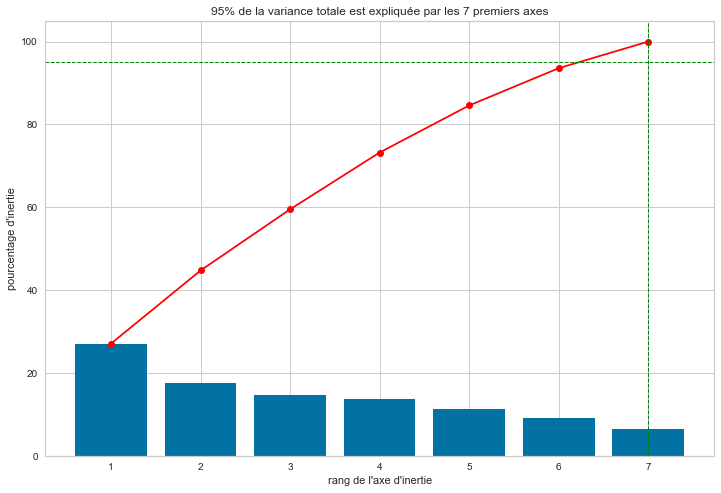

In [16]:
# PCA Pipeline
pca = Pipeline([
    ("preprocessor", preprocessor),
    ("pca", PCA(svd_solver='full')),
               ])

X_projected = pca.fit_transform(X_scaled)
PCS = pd.DataFrame(pca.named_steps['pca'].components_, columns=X.columns).T
variance = pca.named_steps['pca'].explained_variance_ratio_*100
utils.plotPca(variance)

In [17]:
np.argmax(np.cumsum(pca.named_steps['pca'].explained_variance_ratio_) > 0.99)

6

In [18]:
np.argmax(np.cumsum(pca.named_steps['pca'].explained_variance_ratio_) >= 0.95)

6

95% de la variance explique dans les sept premiers axes

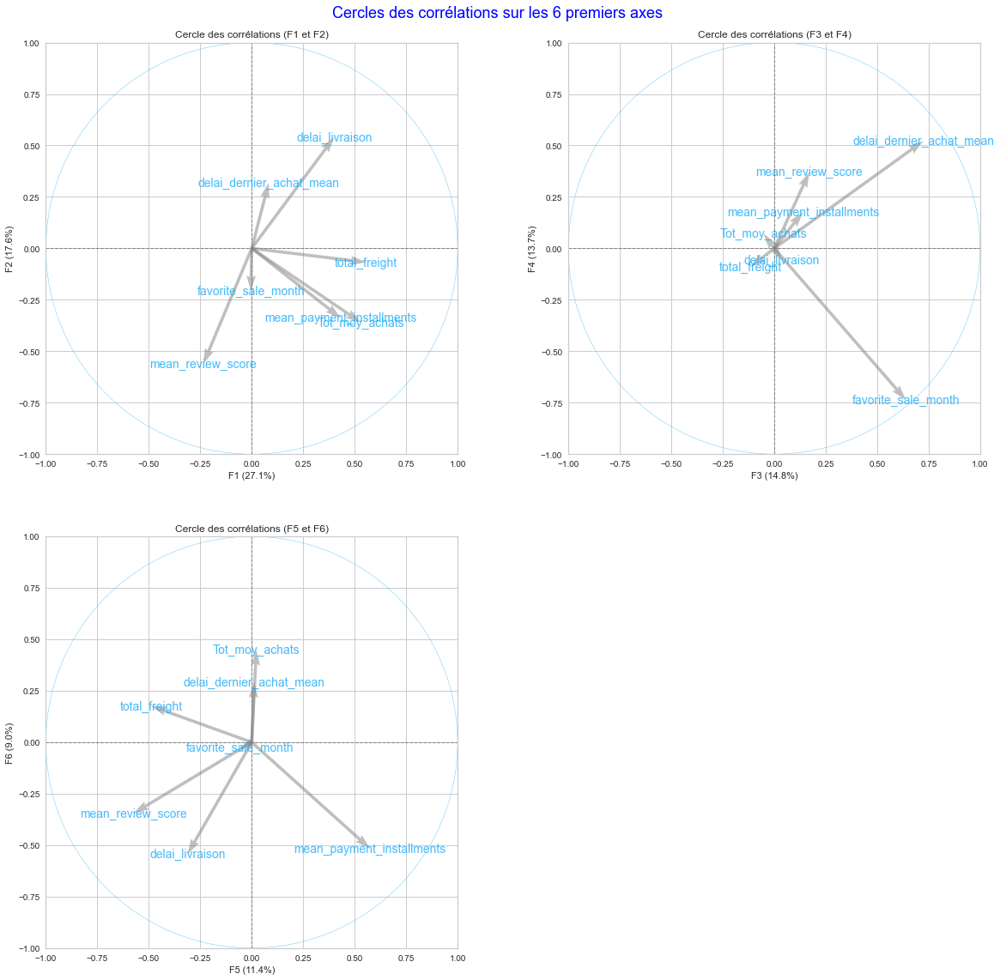

In [19]:
pcs = pca.named_steps['pca'].components_
utils.cerle_corr(pcs, 6, pca.named_steps['pca'], [(0, 1), (2, 3), (4, 5)],
                 labels=np.array(X.columns))

<a name='ts'></a>

<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           TSNE vs ACP
        </h1>
    </div>
</div>

Nous allons projeter sur deux axes nos projections Tsne et ACP

In [20]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=50, n_iter=500)
tsne_results = tsne.fit_transform(X_scaled_sample)

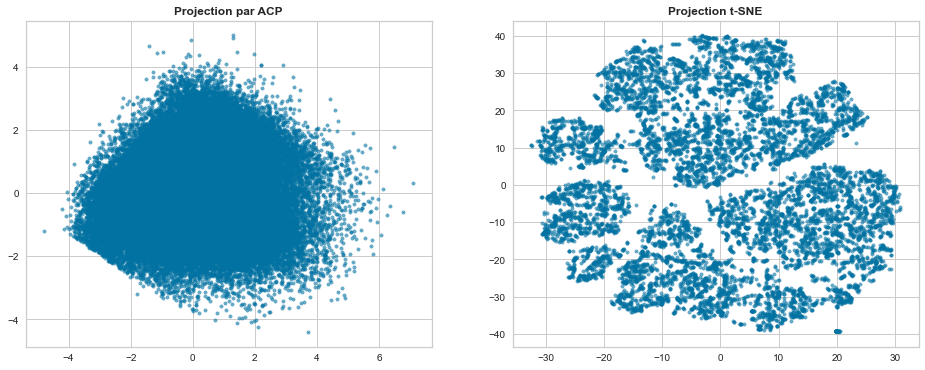

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(X_projected[:, 0], X_projected[:, 1], alpha=0.6, marker='.')
ax[0].set_title('Projection par ACP', fontsize=12, weight='bold')
ax[1].scatter(tsne_results[:, 0], tsne_results[:, 1], alpha=0.6, marker='.')
ax[1].set_title('Projection t-SNE', fontsize=12, weight='bold')
plt.show()

<a name='kmeans'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           K means
        </h1>
    </div>
</div>

Cette algorithme permet d’analyser un jeu de données caractérisées par un ensemble de descripteurs, afin de regrouper les données “similaires” en groupes *(ou clusters)*. Après avoir initialisé des centroïdes en prenant des données au hasard dans le jeu de données,

K-means alterne plusieurs fois ces deux étapes pour optimiser les centroïdes et leurs groupes : 

1. Regrouper chaque objet autour du centroïde le plus proche. 
2. Replacer chaque centroïde selon la moyenne des descripteurs de son groupe.

L’algorithme a convergé après un certain nombre d'itérations et trouve un découpage stable du jeu de données. Cependant, le nombre de Clusters est à définir par l'utilisateur. 

**Méthode du coude** KElbowVisualizer de Yellowbrick implémente la méthode du «coude» pour sélectionner le nombre optimal de clusters en ajustant le modèle K-Means avec une plage de valeurs pour K. Si le graphique en courbes ressemble à un bras, alors le «coude» (le point d'inflexion sur la courbe) est une bonne indication du nombre de K optimal.

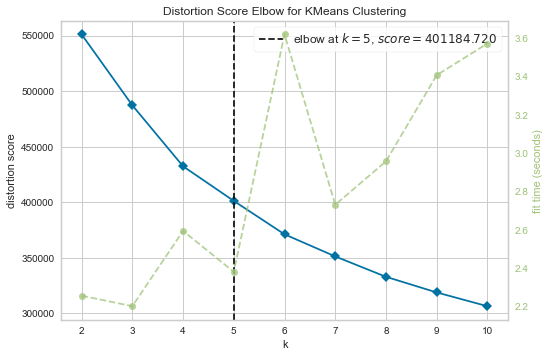

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [22]:
# Elbow method
kmeans_visualizer = Pipeline([
    ("preprocessor", preprocessor),
    ("kelbowvisualizer", KElbowVisualizer(KMeans(random_state=4), K=(4, 12)))
])
kmeans_visualizer.fit(X)
kmeans_visualizer.named_steps['kelbowvisualizer'].show()

la methode du coude base sur la metrique distortion score ,nous indique d utilise un  **K = 5**
c est la somme moyenne des carrés des distances aux centres, 

In [23]:
bestK = kmeans_visualizer.named_steps['kelbowvisualizer'].elbow_value_
print('best cluster K={}'.format(bestK))

best cluster K=5


In [24]:
k_means = Pipeline([
    ("preprocessor", preprocessor),
    ("kmeans", KMeans(n_clusters=bestK, random_state=21, n_init=10))
])
k_means.fit(X)

kmeans_labels = k_means.named_steps['kmeans'].labels_
data["kmeans_label"] = kmeans_labels
original_data["kmeans_label"] = kmeans_labels

<AxesSubplot:>

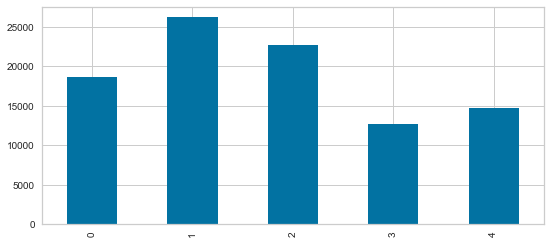

In [25]:
# Distribution of the customers
pd.Series(k_means.named_steps['kmeans'].labels_)\
    .value_counts().sort_index().plot.bar(figsize=(9, 4))

<a name='si'></a>


<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           Coefficient de silhouette
        </h1>
    </div>
</div>

Pour vérifier si ce clustering fonctionne, nous allons utiliser SilhouetteVisualizer pour afficher le coefficient de silhouette pour un échantillonage de chaque cluster. Cela permet de visualiser la densité et la séparation des clusters.


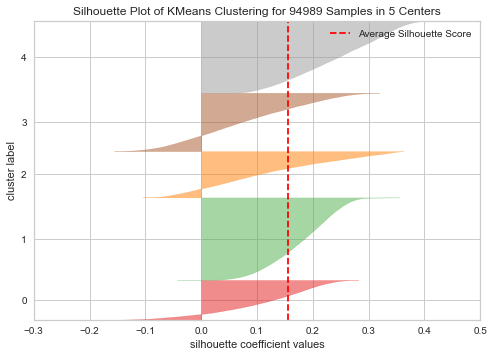

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 94989 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [26]:
# Silhouette Visualizer
silhouette_visualizer = Pipeline([
    ("preprocessor", preprocessor),
    ("silhouettevisualizer", SilhouetteVisualizer(KMeans(n_clusters=bestK)))
])
silhouette_visualizer.fit(X)
silhouette_visualizer.named_steps['silhouettevisualizer'].show()

Le score de chaque échantillon est calculé en faisant la moyenne du coefficient de silhouette (différence entre la distance moyenne intra-cluster et la distance moyenne du cluster le plus proche pour chaque échantillon), normalisée par la valeur maximale. Cela nous donne un score entre -1 et 1, qui nous permet de déterminer si la séparation est efficace ou si les points sont assignés au mauvais cluster.

**les clusters semblent relativement repartis sauf pour deux clusters**



<a name='cal'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           kmeans avec la metric calinski_harabasz
        </h1>
    </div>
</div>


Nous allons tester la valeurs de K avec une autre metrique , Calinski Harabasz (rapport entre la dispersion des grappes dans et entre les groupes.)

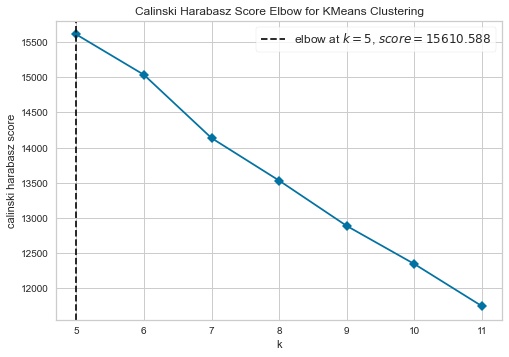

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [27]:
# Instantiate the clustering model and visualizer
visualizer = Pipeline([
    ("preprocessor", StandardScaler()),
    ("kelbowvisualizer", KElbowVisualizer(
        KMeans(random_state=4, n_init=10),
        k=(bestK, 12),
        metric='calinski_harabasz',
        timings=False))
])
visualizer.fit(X)        # Fit the data to the visualizer
visualizer.named_steps['kelbowvisualizer'].show()

**une clusterisation de 5 ressort egalement**, nous allons donc conserver ce nombre

<a name='sep'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           Separation inter clusters
        </h1>
    </div>
</div>


Sur cette projection , on remarque que les différents clusters sont bien séparés sur les 2 premières composantes principales. Le clustering semble donc performant 

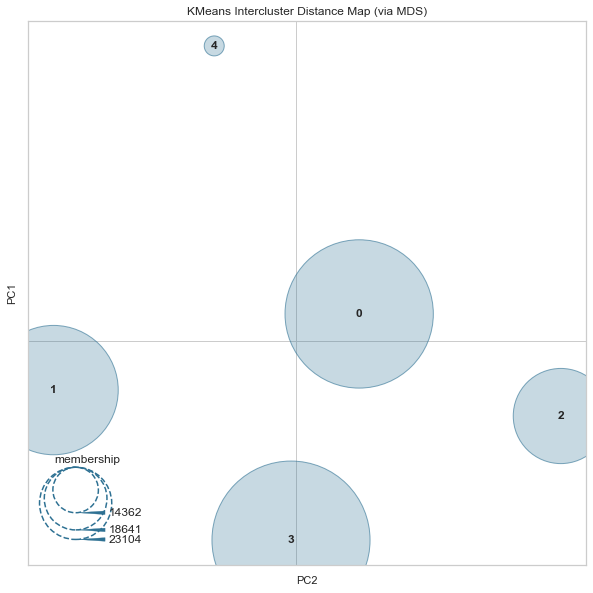

<AxesSubplot:title={'center':'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [28]:
fig = plt.figure(figsize=(10, 10))
# Intercluster distance Map with best k
distance_visualizer = Pipeline([
    ("preprocessor", preprocessor),
    ("distancevisualizer", InterclusterDistance(KMeans(bestK)))])
distance_visualizer.fit(X)
distance_visualizer.named_steps['distancevisualizer'].show()

<a name='pro'></a>
<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           Projection de nos clusters sur les axes ACP
        </h1>
    </div>
</div>

<AxesSubplot:xlabel='0', ylabel='1'>

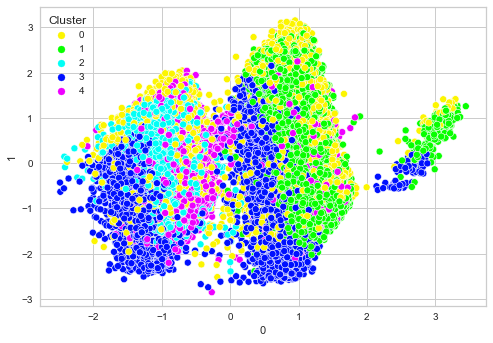

In [29]:
acp = pd.concat([pd.DataFrame(X_projected[:, 2:4]),
                 pd.Series(kmeans_labels)], axis=1)
acp.columns = [0, 1, 'Cluster']
sns.scatterplot(
                x=0,
                y=1,
                hue='Cluster',
                data=acp,
                legend='full',
                palette=sns.color_palette("hsv", bestK))

<AxesSubplot:xlabel='0', ylabel='1'>

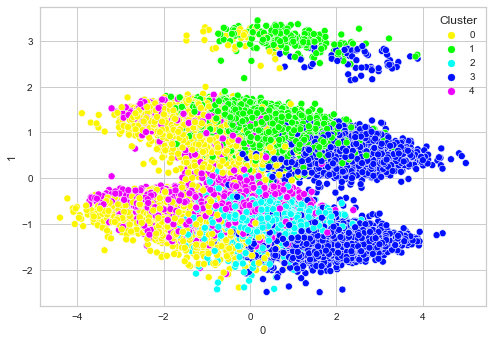

In [30]:
acp = pd.concat([pd.DataFrame(X_projected[:, 1:3]),
                 pd.Series(kmeans_labels)], axis=1)
acp.columns = [0, 1, 'Cluster']
sns.scatterplot(
    x=0,
    y=1,
    hue='Cluster',
    data=acp,
    legend='full',
    palette=sns.color_palette("hsv", bestK))

In [31]:
kmean_labels = k_means.named_steps['kmeans'].labels_
X_scaled["kmeans_label_pca"] = kmean_labels
commun = X_scaled.loc[X_scaled_sample.index, :]
commun

,total_freight,mean_payment_installments,mean_review_score,delai_dernier_achat_mean,delai_livraison,Tot_moy_achats,favorite_sale_month,kmeans_label_pca
customer_unique_id,,,,,,,,
d798e8eafe52d3424dc0c88e95bcf978,1.134776,-0.060707,0.677820,0.964172,-0.002323,1.518885,0.609625,0
57844d51722207fb8815173870246dd3,-0.052817,1.310732,0.677820,-0.741479,1.217704,0.172751,-0.629354,0
f1f7d2e28cc72c36f4c1194d7fb47843,-0.249776,1.948414,-0.081483,-0.074903,-0.155475,1.659229,-1.558588,0
92dad797c35a05214b4ffcf93952aaa8,-1.193593,-0.925988,0.677820,-0.767619,-1.430843,-0.691639,-0.629354,4
4f8cd38150dcfc995a061901a89beabe,-0.810535,-0.925988,-0.840785,0.415227,-0.155475,-1.281669,1.229115,1
...,...,...,...,...,...,...,...,...
1e10198c6db36a8836eb94f872451ffb,1.336391,-0.925988,-0.840785,1.519652,-0.155475,-1.471250,-0.319609,1
91a7b48057f6fbf9a4902ee9f3bcbb02,1.086598,-0.925988,0.677820,1.839870,-0.002323,1.109748,-0.939098,1
1df15fd7f97823fb37e2f04913d91343,-0.557549,-0.925988,-0.081483,-1.408055,0.475828,-0.357028,0.609625,2


**L'algorithme t-SNE** se base sur une interprétation probabiliste des proximités. Une distribution de probabilité est définie sur les paires de points de l'espace d'origine de telle sorte que des points proches l'un de l'autre ont une forte probabilité d'être choisis tandis que des points éloignés ont une faible probabilité d'être sélectionnés

Nous allons tenter d utiliser cette algorithme, en changeant le parametre de perplexite, et nous allons projeter par la meme occasion les clusters detecter par notre kmeans afin de confirmer notre segmentation

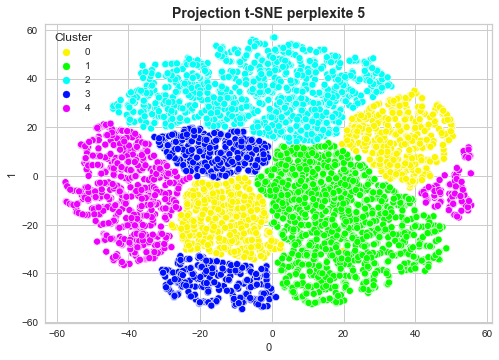

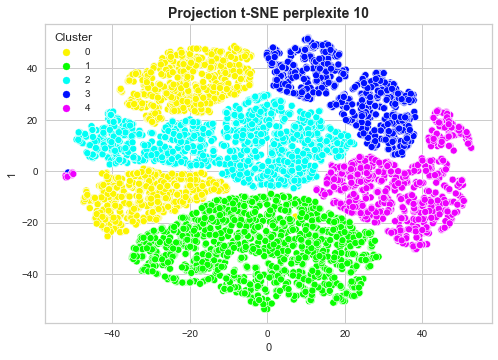

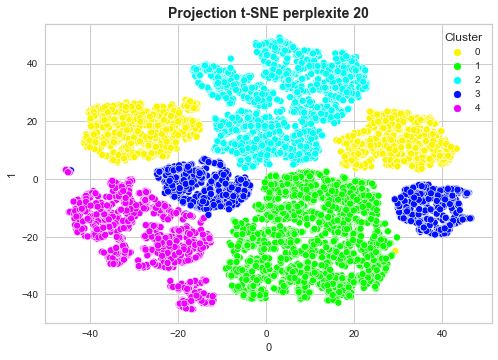

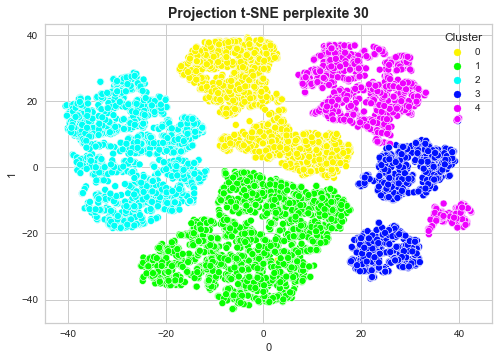

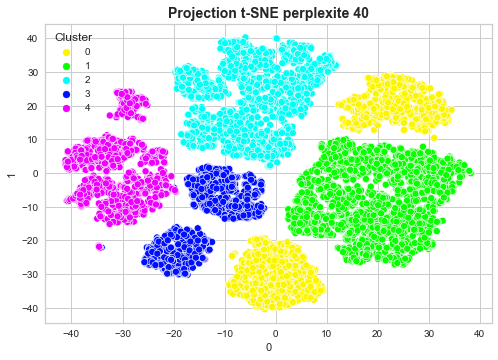

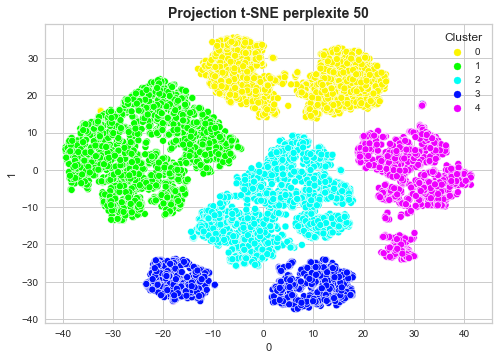

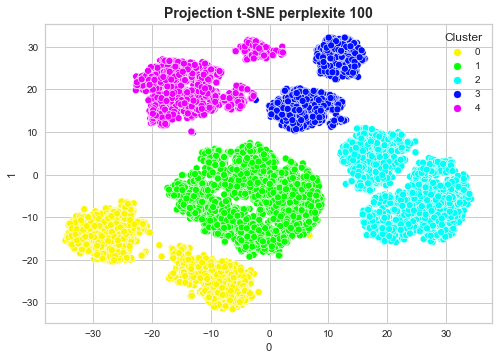

In [32]:
for perplexite in [5, 10, 20, 30, 40, 50, 100]:
    tsne = TSNE(n_components=2, perplexity=perplexite, n_iter=500, n_jobs=-1)
    tsne_results = tsne.fit_transform(commun)

    tsne = pd.concat([
        pd.DataFrame(tsne_results),
        pd.Series(commun["kmeans_label_pca"].values)],
        axis=1)
    tsne.columns = [0, 1, 'Cluster']

    sns.scatterplot(
        x=0,
        y=1,
        hue='Cluster',
        data=tsne,
        legend='full',
        palette=sns.color_palette("hsv", bestK))
    plt.title(
        'Projection t-SNE perplexite {}'.format(perplexite),
        fontsize=14,
        weight='bold')
    plt.show()

On remarque qu avec une perpelexite de 40-100 que nos clusters **semblent bien repartis avec kmeans**

<a name='hi'></a>

<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           Hierarchical Clustering
        </h1>
    </div>
</div>

Cette methode consiste a aggrege chaque points ou groupes de points progressivement jusqu a former un cluster.
La methode du dendogram aide a determiner le nombre optimal de clusters

In [33]:
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
from sklearn.metrics import adjusted_rand_score

In [34]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None,
                                linkage='ward')
model = model.fit(X_scaled_sample)

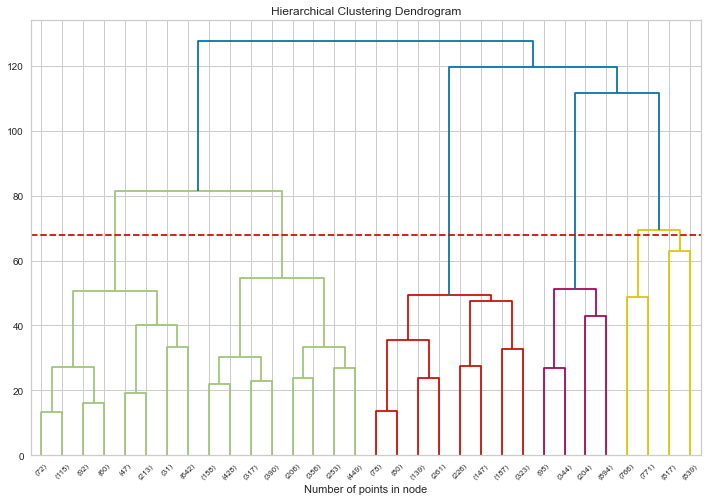

In [35]:
plt.figure(figsize=(12, 8))
plt.title('Hierarchical Clustering Dendrogram')
# plot the top four levels of the dendrogram
utils.plot_dendrogram(model, truncate_mode='level', p=4)
plt.xlabel("Number of points in node")
plt.axhline(y=68, color='r', linestyle='--')
plt.show()

In [36]:
n_clus = 5
model = AgglomerativeClustering(n_clusters=n_clus)
AGlabels = model.fit_predict(X_scaled_sample)

<AxesSubplot:>

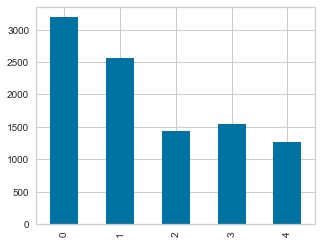

In [37]:
pd.Series(AGlabels).value_counts().sort_index().plot.bar(figsize=(n_clus, 4))

Comme pour le kmeans nous allons projeter les clusters detecter par AgglomerativeClustering

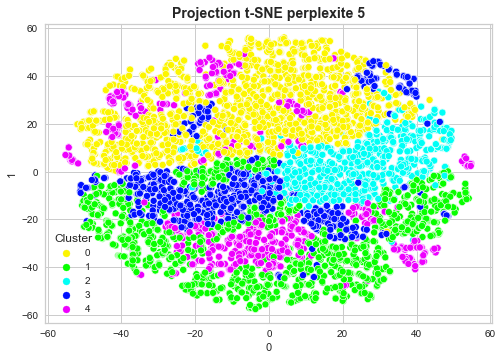

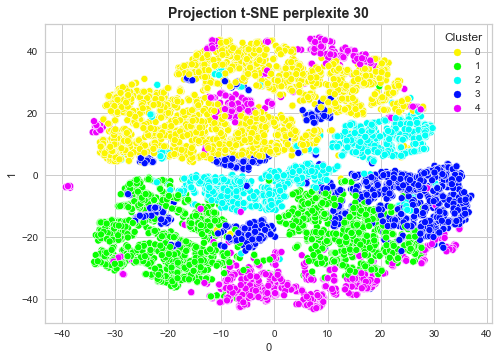

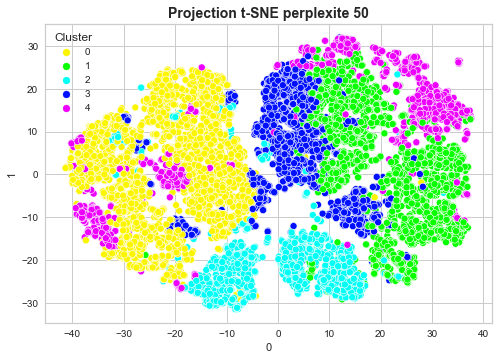

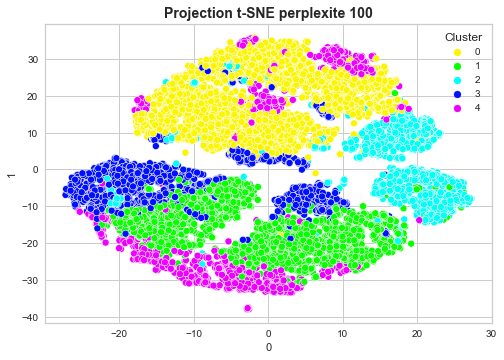

In [38]:
for perplexite in [5, 30, 50, 100]:
    tsne = TSNE(n_components=2, perplexity=perplexite, n_iter=500, n_jobs=-1)
    tsne_results = tsne.fit_transform(X_scaled_sample)
    tsne = pd.concat([pd.DataFrame(tsne_results), pd.Series(AGlabels)], axis=1)
    tsne.columns = [0, 1, 'Cluster']
    sns.scatterplot(x=0, y=1, hue='Cluster', data=tsne, legend='full',
                    palette=sns.color_palette("hsv", n_clus))
    plt.title(
        'Projection t-SNE perplexite {}'.format(perplexite),
        fontsize=14,
        weight='bold')
    plt.show()

On remarque qu avec une perpelexite de 50-100 que **nos clusters semblent moins bien** repartis avec **l agglomerative clusters** que le **Kmeans**

In [39]:
# X_scaled_clusters_pca = X_scaled.groupby("kmeans_label_pca").mean()
# X_scaled_clusters_pca.iloc[:, :-1].shape

<a name='an'></a>

<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           analyse du clustering k means sur le dataset
        </h1>
    </div>
</div>

Analysons maintenant les donnees metiers qui ressortent de cette clusterisation

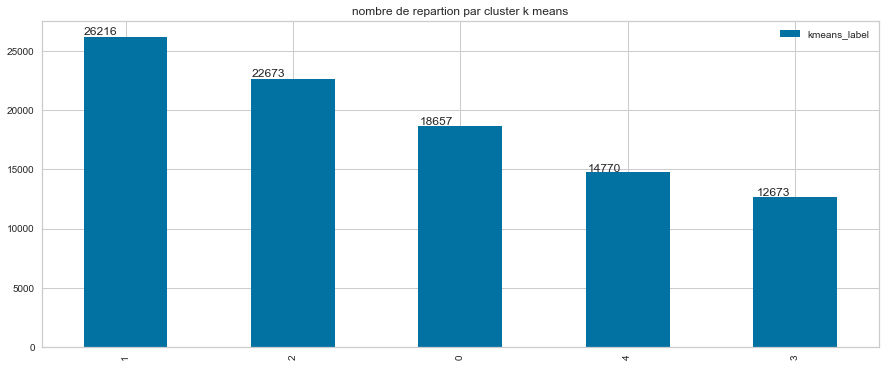

In [40]:
nb = original_data.kmeans_label.value_counts()
ax = nb.plot(kind='bar', figsize=(15, 6))
for p in ax.patches:
    ax.annotate(
        str(p.get_height()),
        (p.get_x() * 1.005, p.get_height() * 1.005))
plt.legend(loc=1)
plt.title('nombre de repartion par cluster k means')
plt.show()

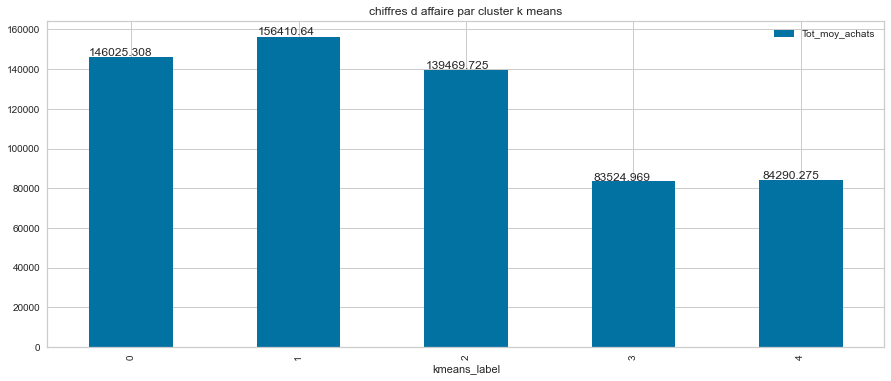

In [41]:
CA = original_data.groupby(["kmeans_label"]).agg(
    Tot_moy_achats=pd.NamedAgg(column="Tot_moy_achats", aggfunc="sum")
)
CA['Tot_moy_achats'] = round(CA['Tot_moy_achats'], 3)
ax = CA.plot(kind='bar', figsize=(15, 6))
for p in ax.patches:
    ax.annotate(
        str(p.get_height()),
        (p.get_x() * 1.005, p.get_height() * 1.005))

plt.legend(loc=1)
plt.title('chiffres d affaire par cluster k means')
plt.show()

Le groupe 4 semblent un groupe particulierement interessant , si l on veut effectuer une campagne publicitaire, ils sont moins nombreux et representent un gros chiffre d affaire 

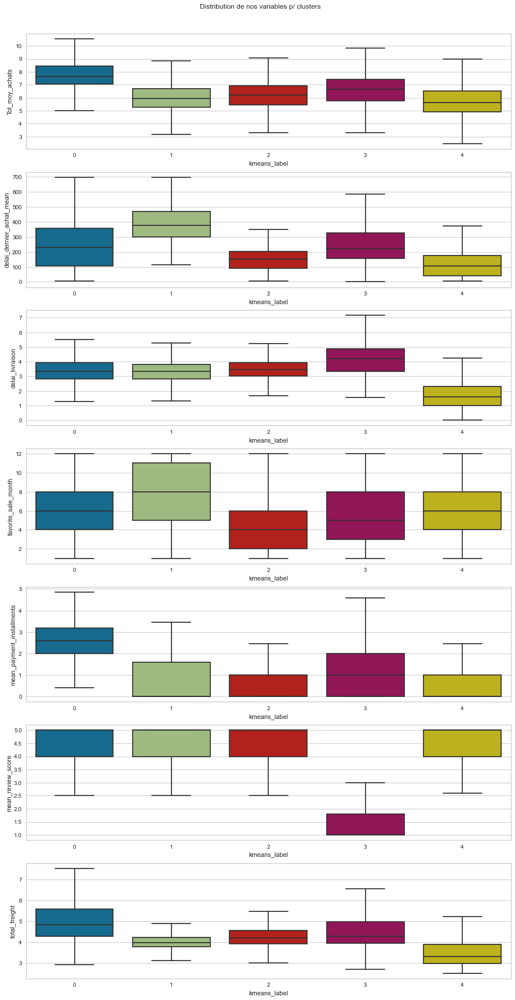

In [42]:
fig = plt.figure(figsize=(15, 30))

col = sorted(
    list(original_data.select_dtypes(include=['float', 'int64']).columns))


for i in range(len(col)):
    fig.add_subplot(len(col), 1, i+1)
    ax = sns.boxplot(
        x="kmeans_label",
        y=col[i],
        data=original_data,
        showfliers=False)
    for tick in ax.get_xticklabels():
        tick.set_rotation(0)

fig.text(0.5, 0.90, "Distribution de nos variables p/ clusters", ha="center")
plt.show()

On remarque clairement que chaque clusters possedent des caracteristiques qui lui sont propres par rapport aux autres clusters

<a name='in'></a>
## Interprétation des clusters

- **Groupe 1** : Courts délais de livraison, commandant vers le début d'année pour des montants faibles. Ils paient avec 1 type de moyen de paiement et avec un nombre faible d'échéances. Les avis de ces clients sont très bons. Petit montant

- **Groupe 2** : Ce sont des clients mécontants (les avis sont mauvais). Les délais de livraison sont très importants et les frais de port élevés. Regle avec plusieurs moyens de paiements , montant moyen, achat vers le debut d annee

- **Groupe 3** : Clients de fin d'année. Ils règlent avec un moyens de paiement pour des montants faibles.  les délais de livraison sont long. Les avis de ces clients sont très bons. Petit ecart avec le dernier achat effectuer, Achat en debut d annee

- **Groupe 4** : Client tres satisfait , avec de grand delai de livraisons et de frais de port sur des petits achats, les delais entre deux commandes dont tres grand, client de fin d annee

- **Groupe 5** : Regroupe les clients qui utilisent plusieurs moyens de paiement et un nombre important d'échéances. Ils ont tendance à espacer les délais entre 2 commandes. Les avis de ces clients sont également très bons. Cette categorie est celle ou les montant sont les plus elevees


In [43]:
X_scaled = preprocessor.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, index=X.index, columns=X.columns)
X_scaled["kmeans_label"] = kmeans_labels
X_scaled_clusters = X_scaled.groupby("kmeans_label").mean()
X_scaled_clusters

,total_freight,mean_payment_installments,mean_review_score,delai_dernier_achat_mean,delai_livraison,Tot_moy_achats,favorite_sale_month
kmeans_label,,,,,,,
0,0.865734,1.231726,0.284993,-0.016897,0.138549,1.050131,0.110302
1,-0.235178,-0.318136,0.339767,0.964119,0.079594,-0.337591,0.553917
2,0.052680,-0.430270,0.346769,-0.641234,0.249298,-0.199513,-0.680830
3,0.259924,0.067963,-2.115240,0.052604,0.837051,0.128227,-0.096948
4,-0.980028,-0.389020,0.319548,-0.750715,-1.417185,-0.531041,0.005801


In [44]:
utils.plot_radars(data=X_scaled_clusters, group="kmeans_label")

<a name='st'></a>

<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           Stabilité du K-Means
        </h1>
    </div>
</div>

K-Means sur scikit learn utilise par default  la méthode K-Means++, ce qui réduit  les effets  lors de l'initialisation des centroïdes. Cependant, vous allons tester la stabilité à l'initialisation en entrainant plusieurs fois le modèle sans fixer le RandomState.

Pour les labels initiaux, nous allons conserver les clusters calculés dans le dernier modèle (avec PCA) puis les comparer grâce à l'indice de Rand ajusté (ARI) pour chacune des itérations.

Creation du Kmeans et entrainement sur les donnees PCA

In [76]:
kmeans_model_pca = Pipeline([
                            ("preprocessor", StandardScaler()),
                            ("kmeans", KMeans(n_clusters=bestK))
                            ])

kmeans_model_pca.fit(X_projected)
# Kmeans labels
pca_kmeans_labels = kmeans_model_pca.named_steps['kmeans'].labels_
X_scaled["kmeans_label_pca"] = pca_kmeans_labels
X_scaled_clusters_pca = X_scaled.groupby("kmeans_label_pca").mean()
X_scaled_clusters_pca.iloc[:, :-1]

,total_freight,mean_payment_installments,mean_review_score,delai_dernier_achat_mean,delai_livraison,Tot_moy_achats
kmeans_label_pca,,,,,,
0,0.224596,0.073431,-2.192187,-0.010236,0.634841,0.128378
1,-0.053942,-0.034228,0.330228,0.448266,0.144160,-0.016473
2,-0.202382,-0.729994,0.362857,-0.766663,-0.271587,-0.275695
3,-0.046142,0.103063,0.315579,1.543011,-0.124653,-0.050930
4,0.277569,1.102952,0.344680,-0.744363,-0.080000,0.431611


- recuperation des labels des clusters Kmeans

- set du data sur les 7 premiers axes ACP

In [77]:
labels = pca_kmeans_labels
pca_data = X_projected[:, :7]

In [80]:
from time import time
from sklearn.metrics import homogeneity_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import adjusted_mutual_info_score
frames = []
for i in range(10):
    results = pd.DataFrame()
    name = 'iter '+str(i)
    model = KMeans(n_clusters=bestK, init="k-means++")
    t0 = time()
    estimator = make_pipeline(StandardScaler(), model).fit(pca_data)
    fit_time = time() - t0
    results['iteration'] = [name]
    results['FitTime'] = [str(fit_time)]
    results['Inertia'] = [estimator[1].inertia_]
    results['homogeneity_score'] = [
        m(labels, estimator[1].labels_) for m in [homogeneity_score]]
    results['adjusted_rand_score'] = [
        m(labels, estimator[1].labels_) for m in [adjusted_rand_score]]
    results['adjusted_mutual_info_score'] = [
        m(labels, estimator[1].labels_) for m in [adjusted_mutual_info_score]]
    frames.append(results)
df = pd.concat(frames)

print('moyenne  adjusted_mutual_info_score : ' +
      str(df['adjusted_mutual_info_score'].mean()))
print('moyenne  adjusted_rand_score : ' +
      str(df['adjusted_rand_score'].mean()))
print('moyenne  homogeneity_score : ' +
      str(df['homogeneity_score'].mean()))
df

moyenne  adjusted_mutual_info_score : 0.9935970605758657
moyenne  adjusted_rand_score : 0.9969962116528464
moyenne  homogeneity_score : 0.9935567945524865


,iteration,FitTime,Inertia,homogeneity_score,adjusted_rand_score,adjusted_mutual_info_score
0,iter 0,2.8415634632110596,439082.861851,0.994036,0.997279,0.994053
0,iter 1,2.7414157390594482,439081.395532,0.993535,0.996951,0.993572
0,iter 2,2.847196340560913,439079.896433,0.992213,0.996359,0.992259
0,iter 3,2.598510503768921,439080.977128,0.993709,0.996993,0.993761
0,iter 4,2.4801411628723145,439080.109837,0.994003,0.997253,0.994043
0,iter 5,2.530897617340088,439081.062435,0.993556,0.996896,0.993609
0,iter 6,2.6951191425323486,439080.266482,0.994252,0.997467,0.994274
0,iter 7,3.2022101879119873,439080.172044,0.993573,0.997033,0.993615
0,iter 8,2.490170955657959,439081.039112,0.993772,0.997009,0.993822
0,iter 9,2.516814708709717,439080.754724,0.992920,0.996722,0.992964


Les différentes itérations montrent des inerties proches, une bonne homogénéité et un score adjusted_mutual_info_score proche de 1. 

Nous pouvons donc en déduire que la stabilité à l'initialisation du modèle K-Means est bonne.

<a name='rd'></a>

<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           K-Means après réduction de dimenssions
        </h1>
    </div>
</div>

**Nous allons donc intégrer à notre pipeline Kmeans une PCA sur 7 composantes pour vérifier si la réduction dimensionnelle réduit la qualité de la segmentation**

In [48]:
X_scaled = preprocessor.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, index=X.index, columns=X.columns)

In [49]:
np.argmax(np.cumsum(pca.named_steps['pca'].explained_variance_ratio_) >= 0.95)

6

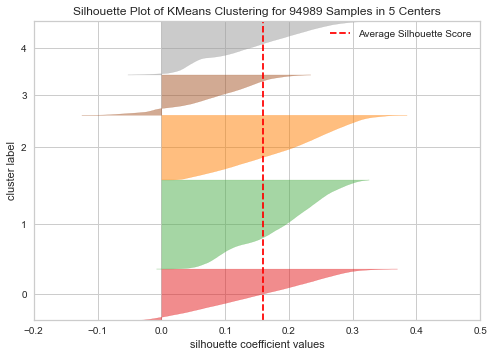

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 94989 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [50]:
# Silhouette Visualizer
silhouette_visualizer = Pipeline([
    ("preprocessor", StandardScaler()),
    ("silhouettevisualizer", SilhouetteVisualizer(KMeans(bestK)))
])
silhouette_visualizer.fit(X_projected[:, :7])
silhouette_visualizer.named_steps['silhouettevisualizer'].show()

Les silhouettes semblent plus homogenes et ont un meilleurs scores avec les donnees ACP projetees sur les 7 premiers axes

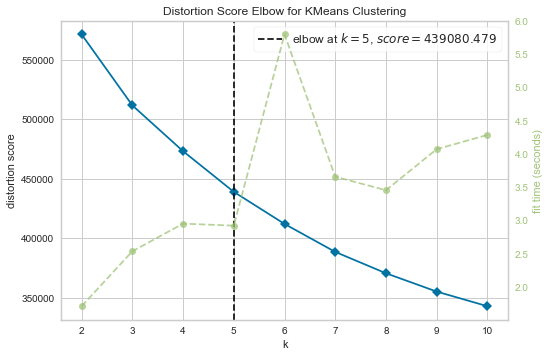

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [51]:
# Instantiate the clustering model and visualizer
# Elbow method
kmeans_visualizer = Pipeline([
    ("preprocessor", StandardScaler()),
    ("kelbowvisualizer", KElbowVisualizer(KMeans(random_state=4), K=(4, 12)))
])
kmeans_visualizer.fit(X_projected[:, :7])
kmeans_visualizer.named_steps['kelbowvisualizer'].show()

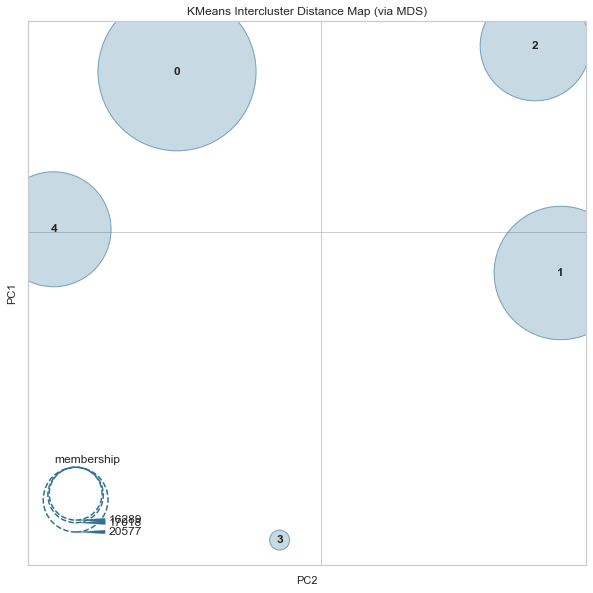

<AxesSubplot:title={'center':'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [52]:
fig = plt.figure(figsize=(10, 10))
# Intercluster distance Map with best k
distance_visualizer = Pipeline([
    ("preprocessor", StandardScaler()),
    ("distancevisualizer", InterclusterDistance(KMeans(n_clusters=bestK)))])
distance_visualizer.fit(X_projected[:, :7])
distance_visualizer.named_steps['distancevisualizer'].show()

La réduction de dimenssion offre les mêmes axes de segmentation. Il est possible de réduire le nombre de features en entrée et d'utiliser les variables de la PCA pour segmenter notre fichier client, les scores silhouette sont meilleurs comparés au données d origine.

<a name='tm'></a>

<div class="bg-primary text-lg-left text-white">
    <div >
        <h1 class="text-center" style="padding: 10px 0 10px 0;">
           Clusterisation temporelle
        </h1>
    </div>
</div>

Dans le but d'établir un contrat de maintenance de segmentation client, nous devons tester sa stabilité dans le temps et voir, par exemple, à quel moment les clients changent de Cluster.

Pour cela, nous devons recalculer toutes les features en fonction d'une période donnée.

**Methodologie suivi :**

La repartition des donnees s'etale sur deux annees de **2016-09-04 à 2018-10-17**

Nous allons comparer **deux modeles kmeans** :

- l un s'etant entrainer sur **la premiere année**

- l autre s'etant entrainer sur **les deux anneés**

**Nos donnees de tests :**

Creation d un dataset avec uniquement la premier anneee ,nous ajoutons ensuite par tranche de deux mois les nouveaux clients au donnees du dataset.
A chaque iteration , nous realisons une clusterisation sur ce dataset , et le comparons au predictions des deux modeles.

Theoriquement le modele entrainais sur la premiere annee va decroitre , alors que l autre devra croitre

**nous nous baserons sur trois metriques pour determiner notre choix :**

- homogeneity_score
- adjusted_rand_score
- adjusted_mutual_info_score


In [53]:
import importlib
# import the module here, so that it can be reloaded.
import utils
importlib.reload(utils)

<module 'utils' from '/media/ismail/Elements/formation/livrable/P4_azdad_ismail/utils.py'>

Recuperation des intervalles de temps d achat des clients

In [54]:
minInterval, maxInterval = utils.getMinMaxOrderInterval()

In [55]:
minInterval

Timestamp('2016-09-04 21:15:19')

In [56]:
maxInterval

Timestamp('2018-10-17 17:30:18')

In [57]:
alldata = utils.getDatabyPeriod(minInterval, maxInterval)
k_means = Pipeline([("preprocessor", preprocessor),
                    ("kmeans",
                     KMeans(n_clusters=bestK, random_state=42, n_init=10))])
k_means.fit(alldata)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('scaler', StandardScaler(),
                                                  ['total_freight',
                                                   'mean_payment_installments',
                                                   'mean_review_score',
                                                   'delai_dernier_achat_mean',
                                                   'delai_livraison',
                                                   'Tot_moy_achats',
                                                   'favorite_sale_month'])])),
                ('kmeans', KMeans(n_clusters=5, random_state=42))])

Recuperation de la premiere annee uniquement

In [58]:
datebegin = minInterval
dateend = minInterval + pd.DateOffset(months=12)

In [59]:
begin = utils.getDatabyPeriod(datebegin, dateend)

In [60]:
begin.shape

(22720, 8)

On entraine notre cluster initial(**temoin**) sur uniquement la premiere annee

In [61]:
# Kmeans on initial period
kmeans_init = Pipeline([("preprocessor", preprocessor),
                        ("kmeans", KMeans(n_clusters=bestK,
                                          random_state=42,
                                          n_init=10))])
kmeans_init.fit(begin)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('scaler', StandardScaler(),
                                                  ['total_freight',
                                                   'mean_payment_installments',
                                                   'mean_review_score',
                                                   'delai_dernier_achat_mean',
                                                   'delai_livraison',
                                                   'Tot_moy_achats',
                                                   'favorite_sale_month'])])),
                ('kmeans', KMeans(n_clusters=5, random_state=42))])

notre modele k_means deja utiliser precedement , entrainer avec tous le dataset

In [62]:
k_means

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('scaler', StandardScaler(),
                                                  ['total_freight',
                                                   'mean_payment_installments',
                                                   'mean_review_score',
                                                   'delai_dernier_achat_mean',
                                                   'delai_livraison',
                                                   'Tot_moy_achats',
                                                   'favorite_sale_month'])])),
                ('kmeans', KMeans(n_clusters=5, random_state=42))])

In [63]:
from time import time
from sklearn.metrics import homogeneity_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import adjusted_mutual_info_score
datebegin = minInterval
dateend = minInterval + pd.DateOffset(months=12)
frames = []
monthlist = np.arange(2, 14, 2)
for i in monthlist:
    results = pd.DataFrame()
    name = str(i)
    # recuperation des donnees par tranche de 2 mois
    dateend = dateend + pd.DateOffset(months=2)
    if(i == max(monthlist)):
        dateend = maxInterval
    print(dateend)
    # recuperation des donnees par tranche de 2 mois
    databyPeriod = utils.getDatabyPeriod(minInterval, dateend)
    print('dataset size {}'.format(databyPeriod.shape))
    # entrainer sur les donnees de maniere incremental
    estimator = Pipeline([("preprocessor", preprocessor),
                         ("kmeans",
                          KMeans(n_clusters=bestK, random_state=42))])
    estimator.fit(databyPeriod)
    labels = k_means.predict(databyPeriod)
    labels_init = kmeans_init.predict(databyPeriod)
    fit_time = time() - t0
    results['Periode'] = [name]
    results['FitTime'] = [str(fit_time)]
    results['Inertia'] = [estimator[1].inertia_]
    # comparaisons de notre baseline avec nos deux modeles
    results['homogeneity_score'] = [
        m(labels, estimator[1].labels_)
        for m in [homogeneity_score]]
    results['adjusted_rand_score'] = [
        m(labels, estimator[1].labels_)
        for m in [adjusted_rand_score]]
    results['adjusted_mutual_info_score'] = [
        m(labels, estimator[1].labels_)
        for m in [adjusted_mutual_info_score]]
    results['homogeneity_score_init'] = [
        m(labels_init, estimator[1].labels_)
        for m in [homogeneity_score]]
    results['adjusted_rand_score_init'] = [
        m(labels_init, estimator[1].labels_)
        for m in [adjusted_rand_score]]
    results['adjusted_mutual_info_score_init'] = [
        m(labels_init, estimator[1].labels_)
        for m in [adjusted_mutual_info_score]]
    frames.append(results)
df = pd.concat(frames)
df

2017-11-04 21:15:19
dataset size (31139, 8)
2018-01-04 21:15:19
dataset size (44010, 8)
2018-03-04 21:15:19
dataset size (57523, 8)
2018-05-04 21:15:19
dataset size (71303, 8)
2018-07-04 21:15:19
dataset size (83531, 8)
2018-10-17 17:30:18
dataset size (94989, 8)


,Periode,FitTime,Inertia,homogeneity_score,adjusted_rand_score,adjusted_mutual_info_score,homogeneity_score_init,adjusted_rand_score_init,adjusted_mutual_info_score_init
0,2,606.9969313144684,124407.464884,0.570945,0.480394,0.571719,0.882870,0.913406,0.883629
0,4,699.9735736846924,176476.188739,0.600747,0.550722,0.609396,0.532765,0.469032,0.538371
0,6,803.5788428783417,237403.523389,0.744006,0.762824,0.744803,0.475760,0.423735,0.474722
0,8,910.880176782608,296247.834094,0.789166,0.806553,0.790176,0.436415,0.342351,0.435313
0,10,1019.387838602066,351438.662408,0.911717,0.930863,0.913081,0.445242,0.336320,0.445460
0,12,1126.9433844089508,407624.221458,1.000000,1.000000,1.000000,0.449754,0.347164,0.451558


In [64]:
print('dataset size {}'.format(databyPeriod.shape))

dataset size (94989, 8)


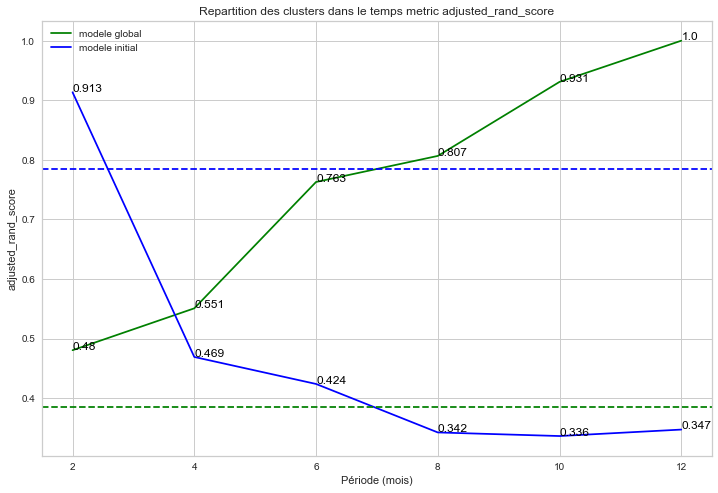

In [65]:
utils.plotTimeClusters(df, 'Periode', 'adjusted_rand_score',
                       'adjusted_rand_score_init')

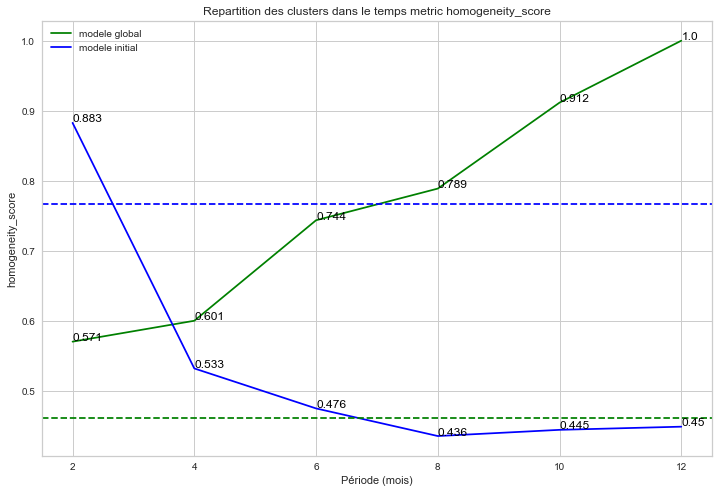

In [66]:
utils.plotTimeClusters(df, 'Periode', 'homogeneity_score',
                       'homogeneity_score_init')

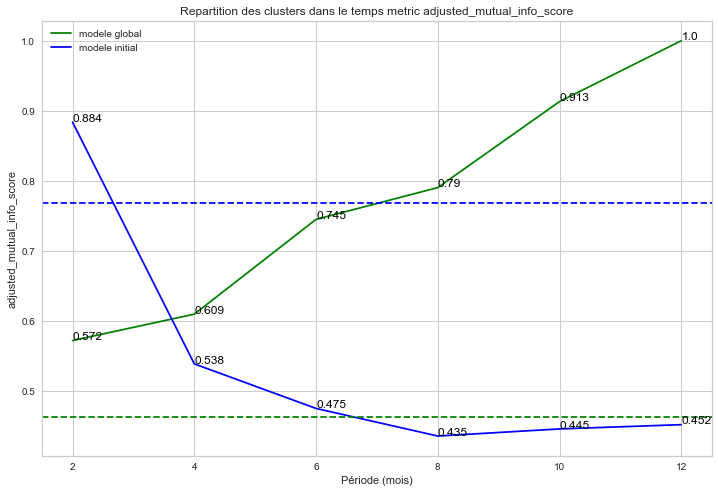

In [67]:
utils.plotTimeClusters(df, 'Periode', 'adjusted_mutual_info_score',
                       'adjusted_mutual_info_score_init')

Comme nous le pensions
- le modele de la premiere annee decroit avec le temp
- le modele des deux annees croit avec le temp

Nous pouvons donc estimer une mise a jour de la segmentation entre 4 et 6 mois , car c est a cette periode temporelle ou le modele de la premiere annee semblent perdre en performance en fonction de ces trois metriques alors qu au contraire le modele global gagne en performance apres 6 mois